In [296]:
from mplfinance.original_flavor import candlestick_ohlc # pip install --upgrade mplfinance
import yfinance as yf  # pip install yfinance
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import requests
from datetime import datetime
import pandas as pd
import warnings
import numpy as np
import seaborn as sns


from dateutil.relativedelta import relativedelta # working with dates with style
from scipy.optimize import minimize              # for function minimization
import statsmodels.formula.api as smf            # statistics and econometrics
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs
from itertools import product
from tqdm import tqdm_notebook
from statsmodels.tsa.filters.hp_filter import hpfilter

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.formula.api import ols
from statsmodels.tools.tools import add_constant
from scipy.stats import shapiro, kstest, normaltest
from statsmodels.stats.diagnostic import kstest_normal, normal_ad

from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt
from scipy.stats import boxcox
from statsmodels.tsa.seasonal import seasonal_decompose


import hvplot.pandas
import hvplot as hv
from holoviews import opts

from prophet import Prophet

sns.set()
%matplotlib inline
warnings.filterwarnings("ignore")

In [297]:
def test_stationarity(timeseries):
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    for [key, value] in dftest[4].items():
        dfoutput['Critical Value (%s)' % key] = value
    print(dfoutput)


def tsplot(y, lags=None, figsize=(14, 10), style='bmh'):
    test_stationarity(y)
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
    with plt.style.context(style):
        plt.figure(figsize=figsize)
        layout = (4, 1)
        ts_ax = plt.subplot2grid(layout, (0, 0), rowspan=2)
        acf_ax = plt.subplot2grid(layout, (2, 0))
        pacf_ax = plt.subplot2grid(layout, (3, 0))

        y.plot(ax=ts_ax, color='blue', label='Or')
        ts_ax.set_title('Original')

        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax, alpha=0.05)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax, alpha=0.05)

        plt.tight_layout()
    return

In [298]:
data=pd.read_csv("../data/data.csv", parse_dates=['dt'])
data.head()

,dt,MW
0,2011-01-01 00:00:00,3416.0
1,2011-01-01 00:15:00,4755.0
2,2011-01-01 00:30:00,4939.0
3,2011-01-01 00:45:00,4939.0
4,2011-01-01 01:00:00,4998.0


In [299]:
data.dt=pd.to_datetime(data.dt)

In [300]:
data.dtypes

dt    datetime64[ns]
MW           float64
dtype: object

In [301]:
data.set_index('dt', inplace=True)

In [302]:
data.tail()

,MW
dt,
2021-12-30 06:45:00,8140.31
2021-12-30 07:00:00,8162.33
2021-12-30 07:15:00,8405.11
2021-12-30 07:30:00,8503.48
2021-12-30 07:45:00,8403.53


In [303]:
data.index

DatetimeIndex(['2011-01-01 00:00:00', '2011-01-01 00:15:00',
               '2011-01-01 00:30:00', '2011-01-01 00:45:00',
               '2011-01-01 01:00:00', '2011-01-01 01:15:00',
               '2011-01-01 01:30:00', '2011-01-01 01:45:00',
               '2011-01-01 02:00:00', '2011-01-01 02:15:00',
               ...
               '2021-12-30 05:30:00', '2021-12-30 05:45:00',
               '2021-12-30 06:00:00', '2021-12-30 06:15:00',
               '2021-12-30 06:30:00', '2021-12-30 06:45:00',
               '2021-12-30 07:00:00', '2021-12-30 07:15:00',
               '2021-12-30 07:30:00', '2021-12-30 07:45:00'],
              dtype='datetime64[ns]', name='dt', length=385566, freq=None)

In [304]:
data.isna().sum()

MW    0
dtype: int64

частота измерений каждые 15 минут

# В индексах есть повторы

In [305]:
data.index.is_unique

False

In [306]:
dublicated_indexes=data[data.index.duplicated()].index.to_list()

In [307]:
dublicated_indexes

[Timestamp('2011-10-30 02:00:00'),
 Timestamp('2011-10-30 02:15:00'),
 Timestamp('2011-10-30 02:30:00'),
 Timestamp('2011-10-30 02:45:00'),
 Timestamp('2012-10-28 02:00:00'),
 Timestamp('2012-10-28 02:15:00'),
 Timestamp('2012-10-28 02:30:00'),
 Timestamp('2012-10-28 02:45:00'),
 Timestamp('2013-10-27 02:00:00'),
 Timestamp('2013-10-27 02:15:00'),
 Timestamp('2013-10-27 02:30:00'),
 Timestamp('2013-10-27 02:45:00'),
 Timestamp('2014-04-07 03:15:00'),
 Timestamp('2014-06-20 14:00:00'),
 Timestamp('2014-06-20 15:00:00'),
 Timestamp('2014-06-25 11:00:00'),
 Timestamp('2014-06-25 12:15:00'),
 Timestamp('2014-06-25 14:00:00'),
 Timestamp('2014-10-26 02:00:00'),
 Timestamp('2014-10-26 02:15:00'),
 Timestamp('2014-10-26 02:30:00'),
 Timestamp('2014-10-26 02:45:00'),
 Timestamp('2015-10-25 02:00:00'),
 Timestamp('2015-10-25 02:15:00'),
 Timestamp('2015-10-25 02:30:00'),
 Timestamp('2015-10-25 02:45:00'),
 Timestamp('2016-10-30 02:00:00'),
 Timestamp('2016-10-30 02:15:00'),
 Timestamp('2016-10-

In [308]:
#заменим значения в повторах на средние по данному индексу и удалим повторы
mean_MW=[]
for index in dublicated_indexes:
    mean_MW.append(data[data.index==index]['MW'].mean())

for i, index in enumerate(dublicated_indexes):
    data.loc[index]=mean_MW[i]

In [309]:
data = data.reset_index().drop_duplicates(subset='dt', keep='first').set_index('dt')

In [310]:
data.shape

(385516, 1)

In [311]:
data.index.is_unique

True

In [312]:
data.isna().sum()

MW    0
dtype: int64

Установим частоту 15 минут

In [313]:
data=data.asfreq('15T', method='ffill')

In [314]:
data.index

DatetimeIndex(['2011-01-01 00:00:00', '2011-01-01 00:15:00',
               '2011-01-01 00:30:00', '2011-01-01 00:45:00',
               '2011-01-01 01:00:00', '2011-01-01 01:15:00',
               '2011-01-01 01:30:00', '2011-01-01 01:45:00',
               '2011-01-01 02:00:00', '2011-01-01 02:15:00',
               ...
               '2021-12-30 05:30:00', '2021-12-30 05:45:00',
               '2021-12-30 06:00:00', '2021-12-30 06:15:00',
               '2021-12-30 06:30:00', '2021-12-30 06:45:00',
               '2021-12-30 07:00:00', '2021-12-30 07:15:00',
               '2021-12-30 07:30:00', '2021-12-30 07:45:00'],
              dtype='datetime64[ns]', name='dt', length=385568, freq='15T')

In [315]:
hvplot.plot(data, width=1000, height=400, kind='line', label="WindMills energy W, 15-minutes")

:Curve   [dt]   (MW)

# Дневные данные

In [316]:
data_daily=data.resample('D').mean()

In [317]:
data_daily

,MW
dt,
2011-01-01,5398.218750
2011-01-02,865.385417
2011-01-03,761.406250
2011-01-04,3922.979167
2011-01-05,2256.239583
...,...
2021-12-26,3072.097396
2021-12-27,6291.646667
2021-12-28,6869.275521


In [318]:
hvplot.plot(data_daily, width=1000, height=400, kind='line', label="WindMills energy W, daily")

:Curve   [dt]   (MW)

# Месячные данные

In [319]:
data_monthly=data.resample('M').mean()

In [320]:
hvplot.plot(data_monthly, width=1000, height=400, kind='line', label="WindMills energy W, monthly")

:Curve   [dt]   (MW)

на данном графике уже наблюдается тренд и сезонность

# Данные за год

In [321]:
data_yearly = data.resample('Y').mean()

In [322]:
hvplot.plot(data_yearly, width=1000, height=400, kind='line', label="WindMills energy W, yearly")

:Curve   [dt]   (MW)

In [323]:
data.describe()

,MW
count,385568.00000
mean,3183.35536
std,3045.75726
min,0.00000
25%,905.00000
50%,2164.00000
75%,4529.87250
max,16727.50000


In [324]:
data.hvplot.box(y='MW', height=400, width=400, legend=False)

:BoxWhisker   (MW)

в данных есть много выбросов

# Есть нулевые данные

In [325]:
null_index=data[data['MW']==0.0]['MW'].index.to_list()

In [326]:
hvplot.plot(data, width=1000, height=400, kind='line')*hvplot.plot(data.loc[null_index], width=1000, height=400, kind='scatter', color='red', size=20, alpha=0.2, label='Null values')

:Overlay
   .Curve.I             :Curve   [dt]   (MW)
   .Scatter.Null_values :Scatter   [dt]   (MW)

# Средние по месяцам

In [327]:
data_daily['Month']=data_daily.index.month

In [328]:
grouped_month=data_daily.groupby('Month')['MW'].mean()

In [329]:
hvplot.plot(grouped_month, width=1000, height=400, kind='line', label='means of each month')

:Curve   [Month]   (MW)

есть сезонность в зависимости от времени года: летом и весной меньше электроэнергии, зимой и осенью - больше

# Средние по дням недели

In [330]:
data_daily['weekday']=data_daily.index.weekday

In [331]:
grouped_weekday=data_daily.groupby('weekday')['MW'].mean()

In [332]:
hvplot.plot(grouped_weekday, width=1000, height=400, kind='line', label='means of each day of week')

:Curve   [weekday]   (MW)

есть недельная сезонность: в первой половине недели идет рост выработки электроэнергии, а во второй половине убыль.

# Исследуем средние по часам

In [333]:
data['hour']=data.index.hour

In [334]:
grouped_hourly=data.groupby('hour')['MW'].mean()

In [335]:
hvplot.plot(grouped_hourly, width=1000, height=400, kind='line', label='means of each hour of the day')

:Curve   [hour]   (MW)

есть зависимость от часа суток: с 00 ночи и к 10 часам утра выработка электроэнергии уменьшается, и далее растет во второй половине суток.

# Исследование на нормальность

In [336]:
def check_normality(data, name):
    data=pd.DataFrame(data, columns=['MW'])
    data['boxcox'], _ =boxcox(data["MW"])
    data['log']=np.log(data['MW'])
    data['sqrt']=np.sqrt(data['MW'])

    plt.rcParams["figure.figsize"] = [7.50, 3.50]
    plt.rcParams["figure.autolayout"] = True
    sns.set(style="darkgrid")


    fig, axs = plt.subplots(2, 2, figsize=(12, 5))

    fig.suptitle(name)

    sns.histplot(data=data, x="MW", kde=True, color="skyblue", ax=axs[0,0])
    sns.histplot(data=data, x="boxcox", kde=True, color="gold", ax=axs[0,1])
    sns.histplot(data=data, x="log", kde=True, color="olive", ax=axs[1,0])
    sns.histplot(data=data, x="sqrt", kde=True, color="gold", ax=axs[1,1])


    plt.show()

так как есть нулевые данные, то преобразование логарифма нельзя применить, рассмотрим дневные данные и месячные

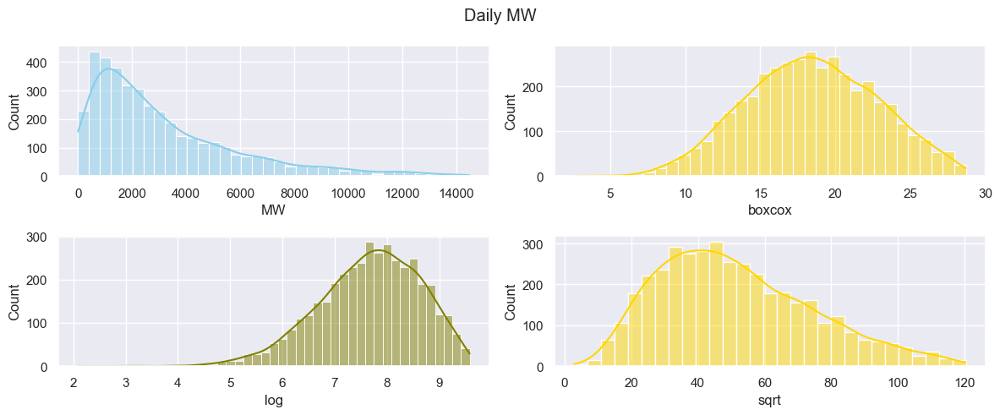

In [337]:
check_normality(data_daily, "Daily MW")

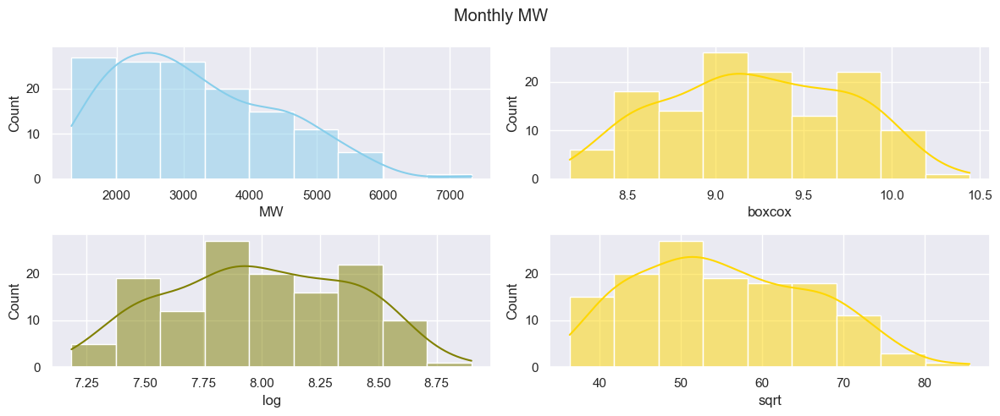

In [338]:
check_normality(data_monthly, "Monthly MW")

данные не нормально распределены, имеют скошенное распределение. После применения преобразований типа log и boxcox становятся более менее нормально распределены.

# Декомпозиция ряда на составляющие

In [340]:
data_decomposed = seasonal_decompose(data['MW'], model='additive', period=15)

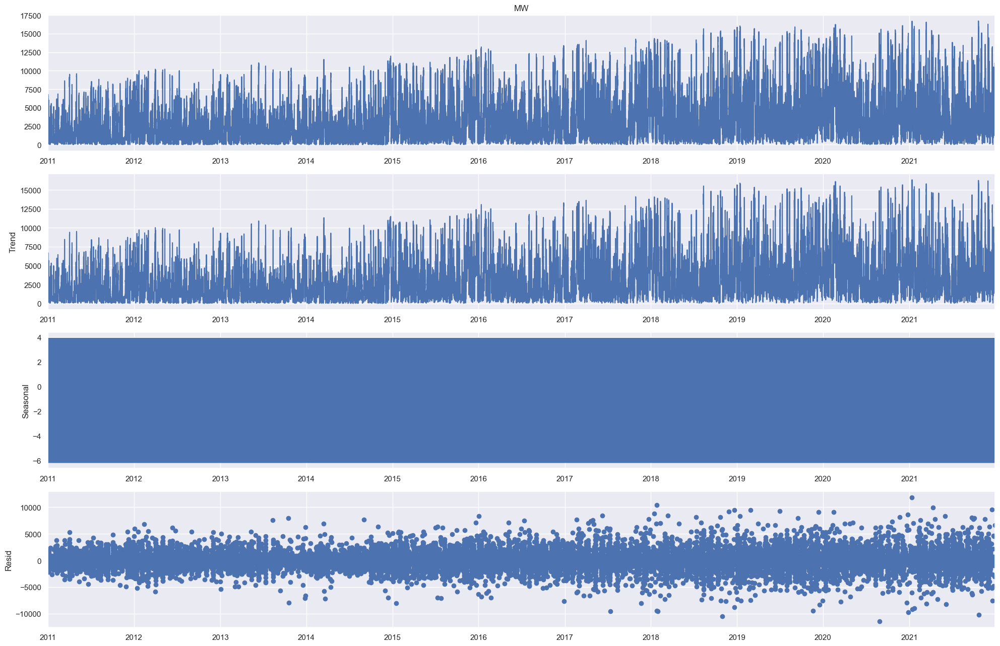

In [341]:
plt.rcParams["figure.figsize"] = (20,13)
data_decomposed.plot()
plt.show();

# Дневные данные

In [342]:
data_decomposed = seasonal_decompose(data_daily['MW'], model='additive')

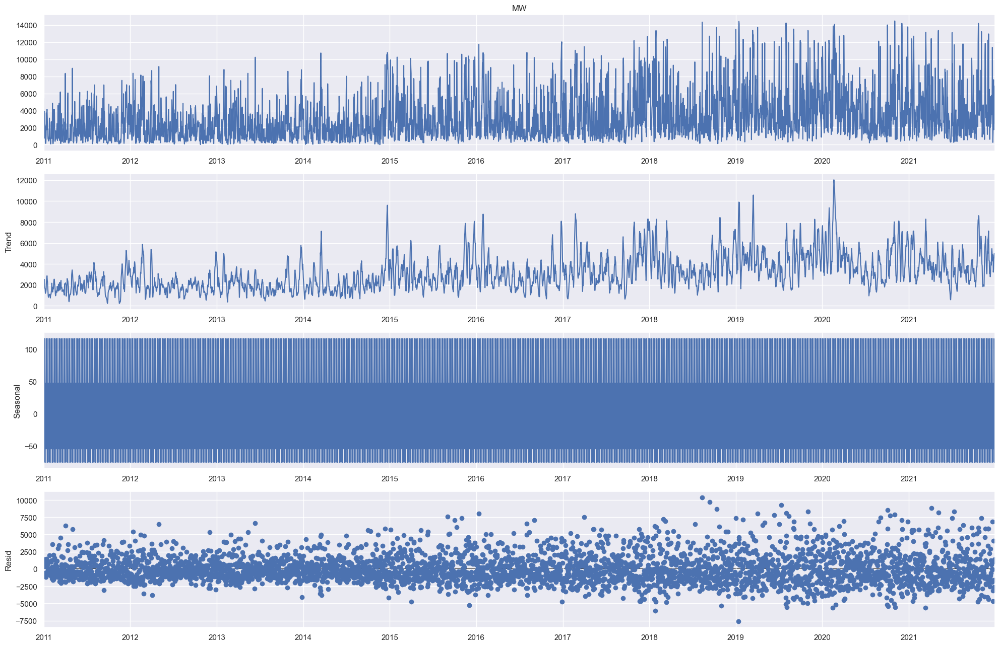

In [343]:
plt.rcParams["figure.figsize"] = (20,13)
data_decomposed.plot()
plt.show();

# Месячные данные

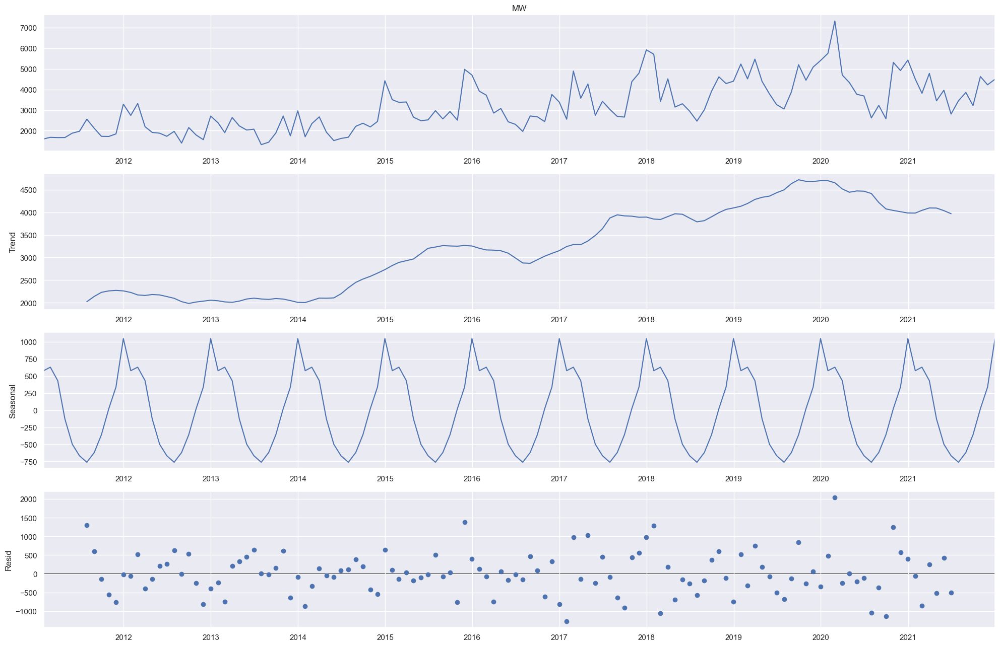

In [344]:
data_decomposed = seasonal_decompose(data_monthly['MW'], model='additive')
plt.rcParams["figure.figsize"] = (20, 13)
data_decomposed.plot()
plt.show();

Здесь четко видна годовая сезонность и тренд.

# Исследуем дневной ряд на стационарность

Results of Dickey-Fuller Test:
Test Statistic                   -5.233005
p-value                           0.000008
#Lags Used                       31.000000
Number of Observations Used    3985.000000
Critical Value (1%)              -3.431992
Critical Value (5%)              -2.862266
Critical Value (10%)             -2.567156
dtype: float64


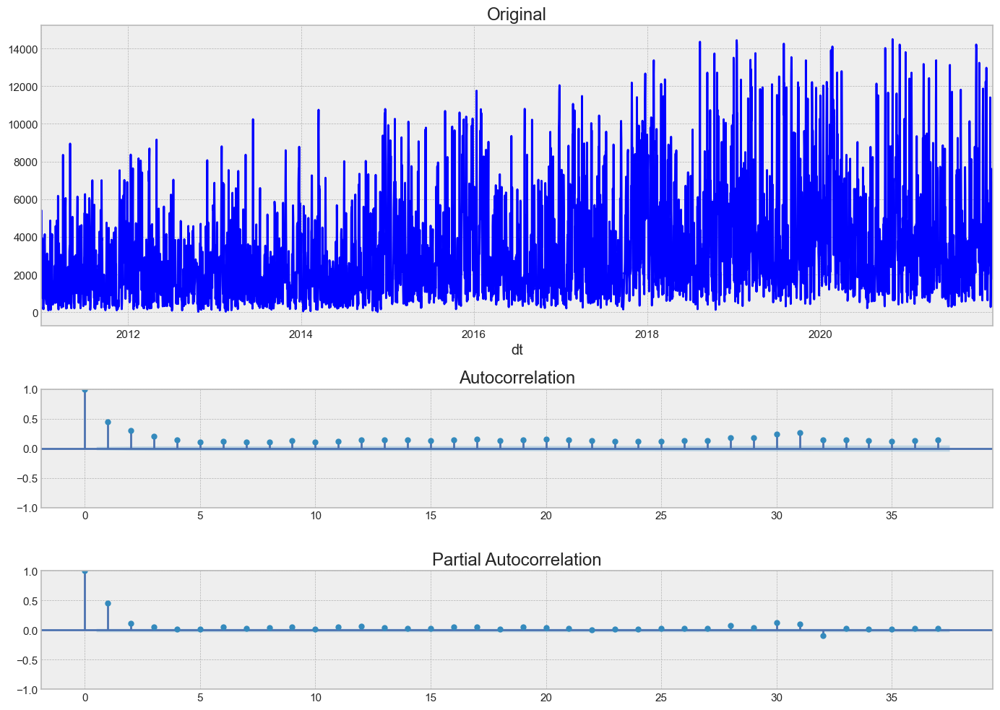

In [345]:
tsplot(data_daily['MW'])

ряд стационарный, так как p-value<0.05.

# Исследуем на стационарность месячные данные

Results of Dickey-Fuller Test:
Test Statistic                  -1.286250
p-value                          0.635439
#Lags Used                      10.000000
Number of Observations Used    121.000000
Critical Value (1%)             -3.485585
Critical Value (5%)             -2.885739
Critical Value (10%)            -2.579676
dtype: float64


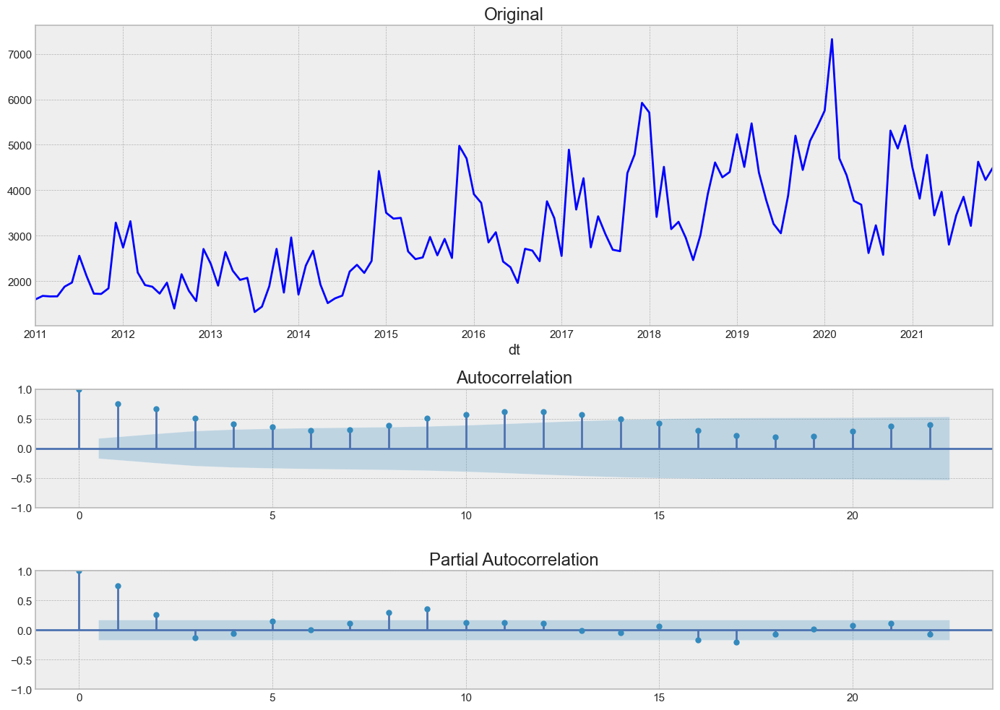

In [346]:
tsplot(data_monthly['MW'])

p-value>0.05 -> не стационарны, пробуем дифференцирование

In [347]:
data_monthly_diff=np.diff(data_monthly['MW'],1)

Results of Dickey-Fuller Test:
Test Statistic                -8.166026e+00
p-value                        8.878776e-13
#Lags Used                     8.000000e+00
Number of Observations Used    1.220000e+02
Critical Value (1%)           -3.485122e+00
Critical Value (5%)           -2.885538e+00
Critical Value (10%)          -2.579569e+00
dtype: float64


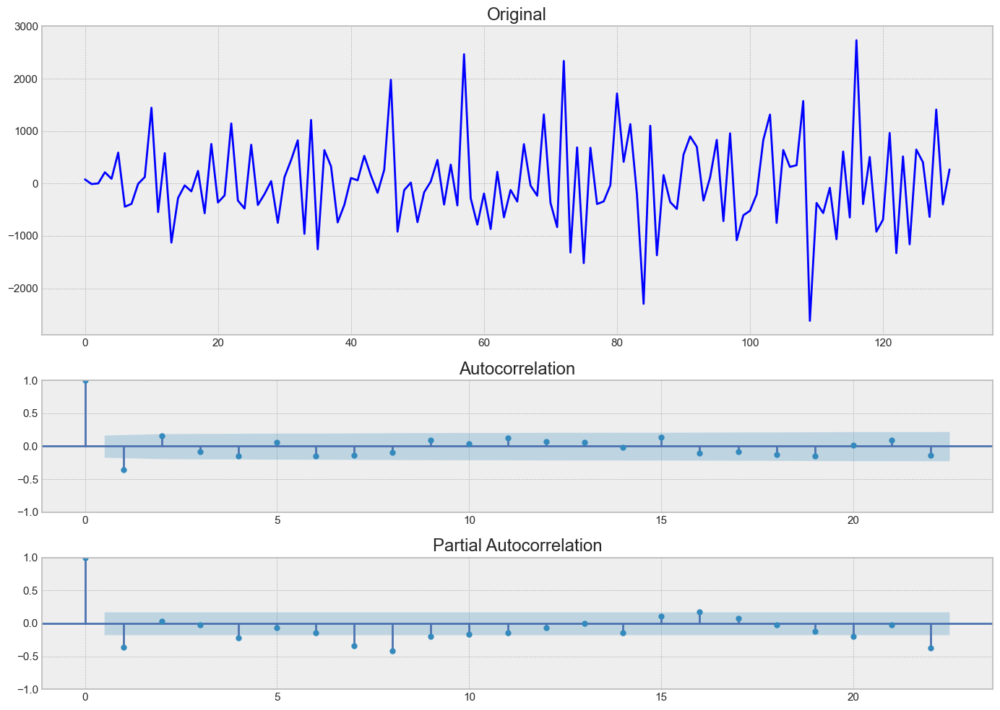

In [348]:
tsplot(data_monthly_diff)

теперь ряд стационарный.

# Отчет по данным

1. Были исследованы данные о выработке электроенергии ветряными мельницами в Германии за период: с 2011-2021 годы.
2. Данные были взяты с 15-минутной частотой, изначально содержали повторы в датах, повторы были заменены на средние значения.
3. Для лучшего визуального анализа ряда были рассмотрены перегруппированные данные за дни, месяцы и годы. На полученных графиках в итоге виден общий тренд и сезонность. Это так же было видно на графиках, полученных при разложении ряда на компоненты.
4. Данные содержат много выбросов, так же присутствуют нулевые значения.
5. Данные не нормально распределены, среднее=3183 W, минимум=0 W, максимум=16727 W.
6. Проанализировав средние по месяцам, можно увидеть что в холодные месяцы (осень-зима) выработка электроэнергии выше, чем в весенне-летний период, что закономерно.
7. Есть так же зависимость среднего значения от дня недели: к середине недели выработка растет, потом резко уменьшается и постепенно снова начинает расти.
8. Есть зависимость среднего значения по часам, с 00 ночи и к 10 часам утра выработка электроэнергии уменьшается, и далее растет во второй половине суток.
9. Дневные данные образуют стационарный ряд, месячные данные - нет, после дифференцирования становятся стационарными.
10. Так как данные имеют сложно настраиваемую сезонность, для прогнозирования была выбрана модель Prophet. Для прогноза на следующий год использовались средние данные за месяц, так как прогноз по дневным данным имел очень низкую точность.


# Прогнозирование на год

# Prophet model

In [349]:
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

Будем прогнозировать с испрользованием средних данных за месяц

In [350]:
# отложим примерно 2 года на тест (20% всех данных, всего 10 лет)
predictions = 26 #в месяцах

data = data_monthly.reset_index()
data.columns = ['ds', 'y']
data.tail()

,ds,y
127,2021-08-31,3854.959956
128,2021-09-30,3215.771219
129,2021-10-31,4626.101416
130,2021-11-30,4226.171878
131,2021-12-31,4493.710178


In [351]:
train_df = data[:-predictions]

In [352]:
model = Prophet(seasonality_mode='additive', weekly_seasonality=True,
                yearly_seasonality=False
                )




model.add_seasonality(name='yearly',
                       period=365.25,
                     fourier_order=3)

model.add_seasonality(name='monthly',
                       period=30.5,
                     fourier_order=3)




model.fit(train_df)




INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


In [353]:
future = model.make_future_dataframe(periods=predictions, freq='M')
forecast = model.predict(future)

Mean absolute percentage error 14.10%


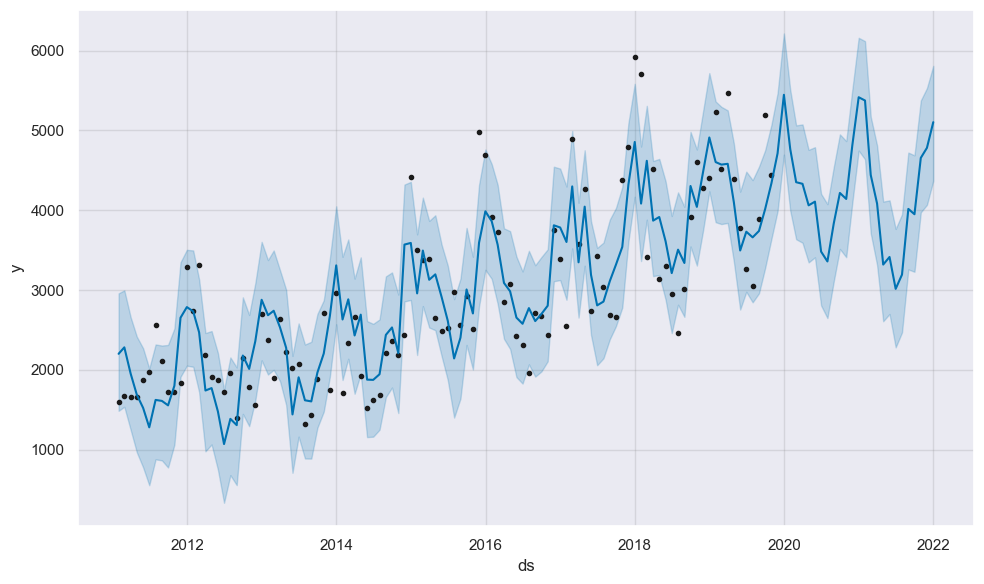

In [354]:
error = mean_absolute_percentage_error(data[-predictions:]['y'], forecast[-predictions:]['yhat'])
print("Mean absolute percentage error {0:.2f}%".format(error))
_ = model.plot(forecast)

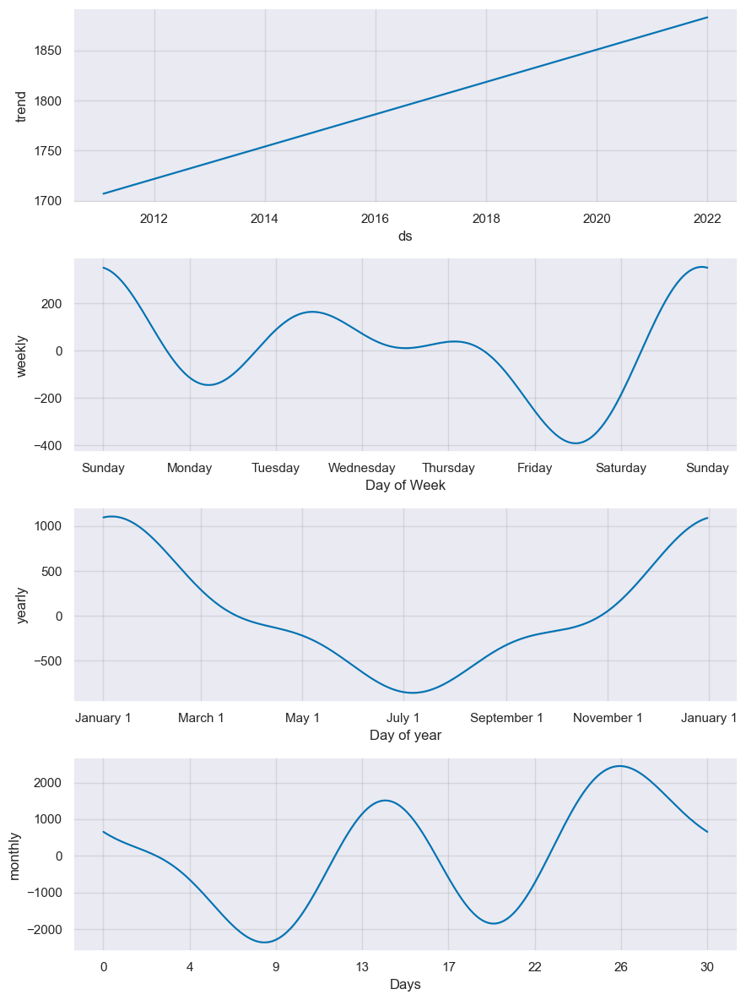

In [355]:
_ = model.plot_components(forecast)

# Cross-Validation

In [356]:
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
import itertools

In [357]:
cutoffs = pd.to_datetime(['2015-01-30', '2016-01-30', '2017-01-30', '2018-01-30'])


param_grid = {
    'seasonality_prior_scale': [0.1, 0.5, 1.0, 10.0]

}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
mapes = []  # Store the MAPEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    model = Prophet(**params, seasonality_mode='additive', yearly_seasonality=False,
                    weekly_seasonality=True)
    model.add_seasonality(name='yearly',
                       period=365.25,
                     fourier_order=3)

    model.add_seasonality(name='monthly',
                       period=30.5,
                     fourier_order=3)


    model.fit(train_df)  # Fit model with given params
    df_cv = cross_validation(model, cutoffs=cutoffs, horizon='365 days',  parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    mapes.append(df_p['mape'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['mape'] = mapes
print(tuning_results)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x0000021AC45F9D30>
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x0000021AB61D0640>
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x0000021AB61F75B0>
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:

   seasonality_prior_scale      mape
0                      0.1  0.222778
1                      0.5  0.239286
2                      1.0  0.229993
3                     10.0  0.258397


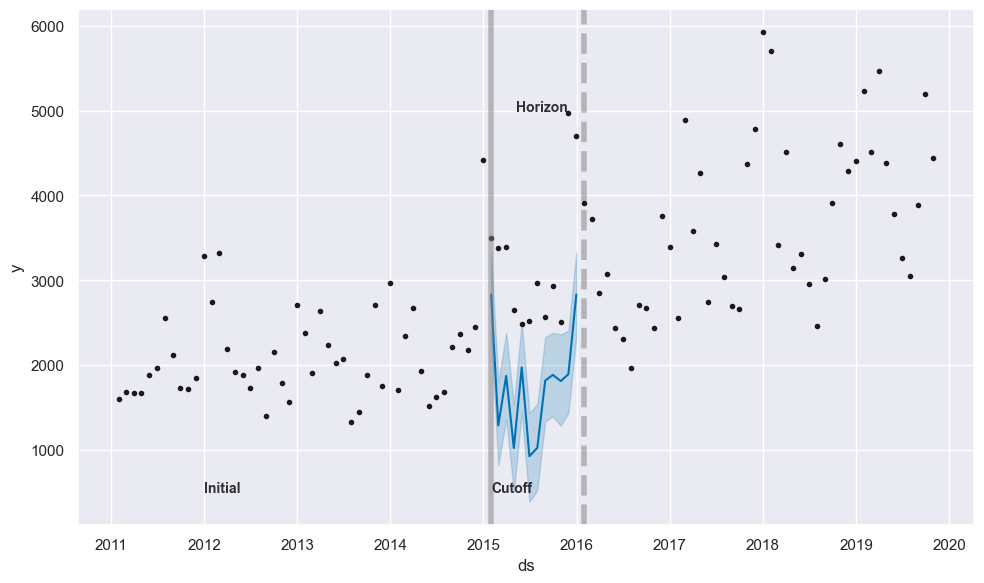

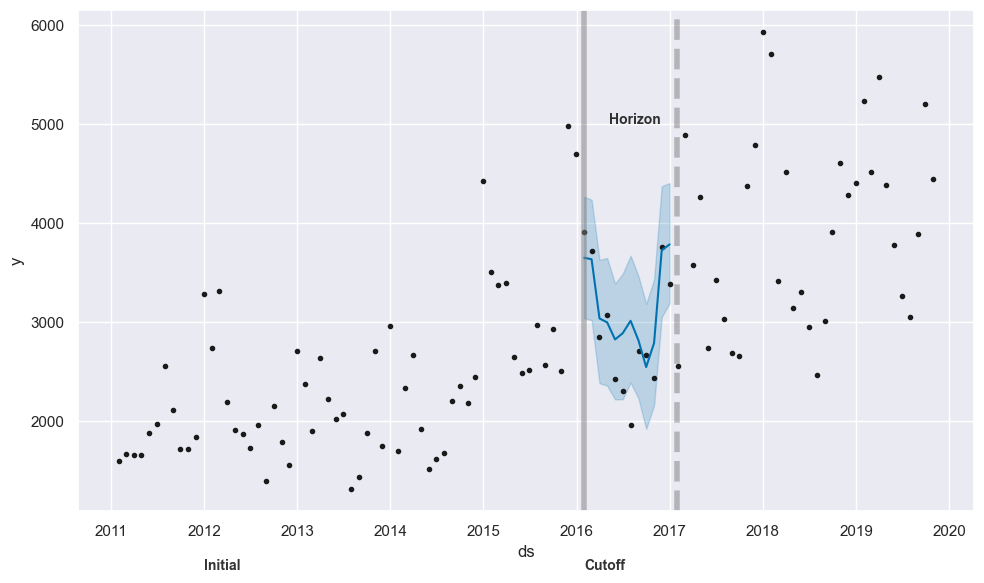

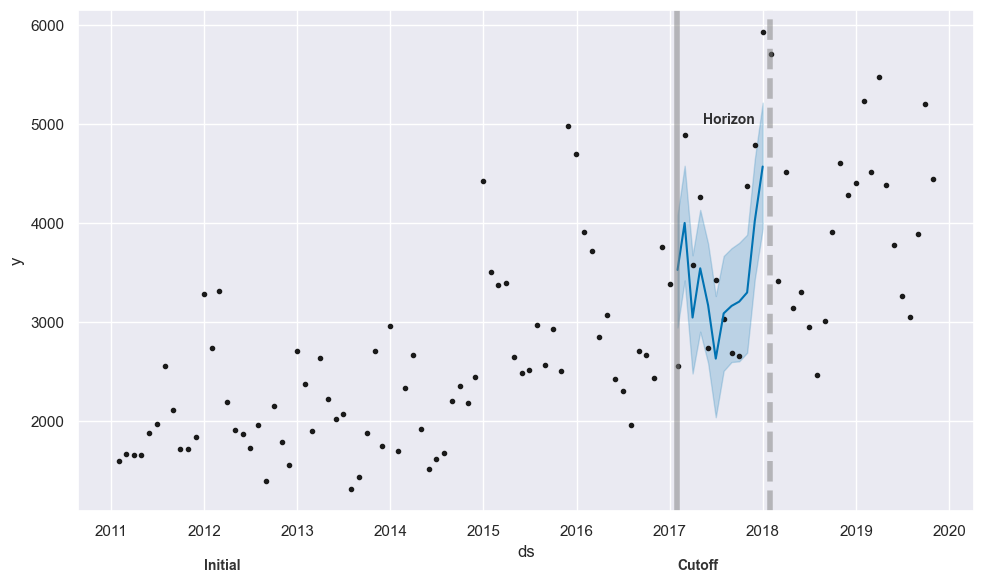

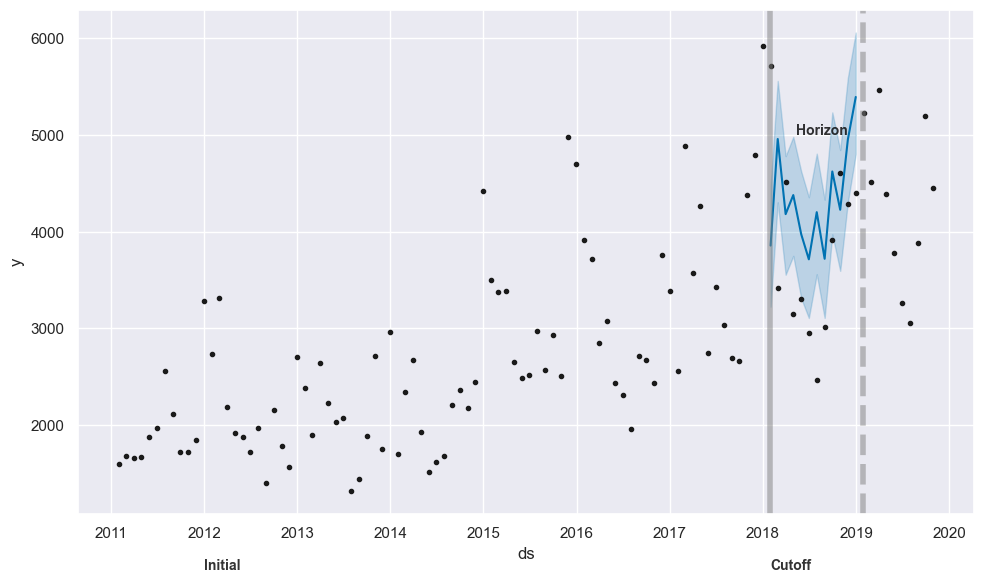

In [358]:
for cutoff in df_cv['cutoff'].unique():
    cutoff_df = df_cv[df_cv['cutoff'].values == cutoff]
    fig = plt.figure(facecolor='w', figsize=(10, 6))
    ax = fig.add_subplot(111)
    ax.plot(model.history['ds'].values, model.history['y'], 'k.')
    ax.plot(cutoff_df['ds'].values, cutoff_df['yhat'], ls='-', c='#0072B2')
    ax.fill_between(cutoff_df['ds'].values, cutoff_df['yhat_lower'],
                cutoff_df['yhat_upper'], color='#0072B2',
                alpha=0.2)
    ax.axvline(x=pd.to_datetime(cutoff), c='gray', lw=4, alpha=0.5)
    ax.set_ylabel('y')
    ax.set_xlabel('ds')
    ax.text(x=pd.to_datetime('2012-01-01'),y=500, s='Initial', color='black',
       fontsize=10, fontweight='bold', alpha=0.8)
    ax.text(x=pd.to_datetime(cutoff),y=500, s='Cutoff', color='black',
       fontsize=10, fontweight='bold', alpha=0.8)
    ax.axvline(x=pd.to_datetime(cutoff) + pd.Timedelta('365 days'), c='gray', lw=4,
           alpha=0.5, ls='--')
    ax.text(x=pd.to_datetime(cutoff)+pd.Timedelta('100 days'),y=5000, s='Horizon', color='black',
       fontsize=10, fontweight='bold', alpha=0.8);
    fig



In [359]:
tuning_results.sort_values(by='mape', ascending=True, inplace=True)
tuning_results

,seasonality_prior_scale,mape
0,0.1,0.222778
2,1.0,0.229993
1,0.5,0.239286
3,10.0,0.258397


In [360]:
best_params = tuning_results.iloc[0][:]
best_params

seasonality_prior_scale    0.100000
mape                       0.222778
Name: 0, dtype: float64

In [361]:
model = Prophet(seasonality_mode='additive', weekly_seasonality=True,
                yearly_seasonality=False,
                seasonality_prior_scale=0.1)




model.add_seasonality(name='yearly',
                       period=365.25,
                     fourier_order=3)

model.add_seasonality(name='monthly',
                       period=30.5,
                     fourier_order=3)




model.fit(train_df)


future = model.make_future_dataframe(periods=predictions, freq='M')

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


Mean absolute percentage error 19.93%


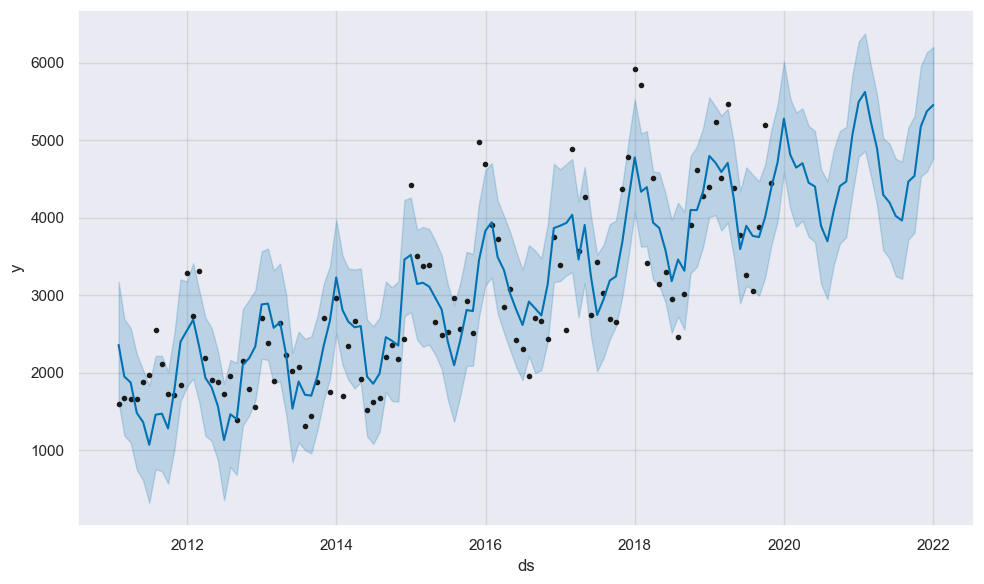

In [362]:
forecast = model.predict(future)
error = mean_absolute_percentage_error(data[-predictions:]['y'], forecast[-predictions:]['yhat'])
print("Mean absolute percentage error {0:.2f}%".format(error))
_ = model.plot(forecast)

С данной регуляризацией модель не улучшила свой прогноз, оставляем первую модель.

# Прогноз на год c лучшей моделью

In [363]:
model = Prophet(seasonality_mode='additive', weekly_seasonality=True,
                yearly_seasonality=False
                )




model.add_seasonality(name='yearly',
                       period=365.25,
                     fourier_order=3)

model.add_seasonality(name='monthly',
                       period=30.5,
                     fourier_order=3)


model.fit(data)


future = model.make_future_dataframe(periods=12, freq='M')

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


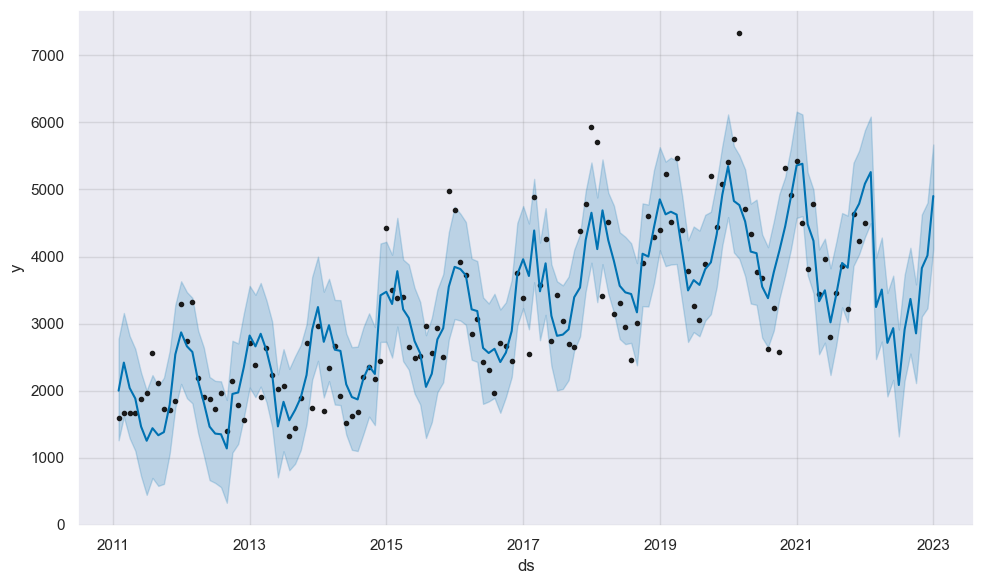

In [364]:
forecast = model.predict(future)
_ = model.plot(forecast)

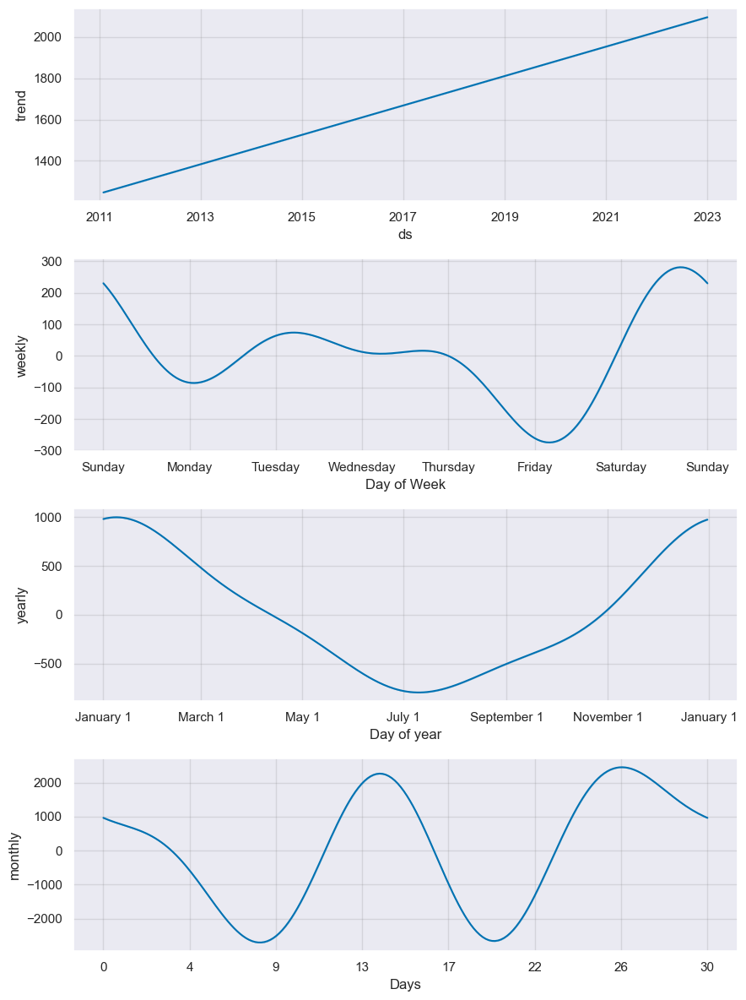

In [365]:
_ = model.plot_components(forecast)

# Выводы
Для прогнозирования выработки электроэнергии была использована модель Prophet с годовой, месячной и недельной сезонностью. На тестовой выборке (20% данных) MAPE опустить ниже 14% не удалось. Кросс-валидация по коэффициенту регуляризации не улучшила показатели прогноза.